In [2]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%qtconsole
%config InlineBackend.figure_format = 'retina'


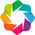

In [4]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cmocean

import loren_frank_data_processing
import spectral_connectivity
import ripple_detection
import replay_classification

import logging
logging.basicConfig(level=logging.INFO)

In [5]:
epoch_key = ('HPa', 5, 2)

In [6]:
from src.analysis import detect_epoch_ripples
from src.parameters import ANIMALS, SAMPLING_FREQUENCY

ripple_times = detect_epoch_ripples(
    epoch_key, ANIMALS, SAMPLING_FREQUENCY)

INFO:src.analysis:Detecting ripples
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO05.mat
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO05.mat


# Non-ripple times

In [7]:
from loren_frank_data_processing import get_trial_time

time = get_trial_time(epoch_key, ANIMALS)

ripple_indicator = pd.Series(np.zeros_like(time, dtype=bool), index=time)

for _, start_time, end_time in ripple_times.itertuples():
    ripple_indicator[start_time:end_time] = True

In [8]:
from loren_frank_data_processing import make_neuron_dataframe

neuron_info = make_neuron_dataframe(ANIMALS).xs(
    epoch_key, drop_level=False).query('numspikes > 0')

In [9]:
from loren_frank_data_processing import get_interpolated_position_dataframe

position_info = get_interpolated_position_dataframe(epoch_key, ANIMALS)

ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO05.mat
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO05.mat


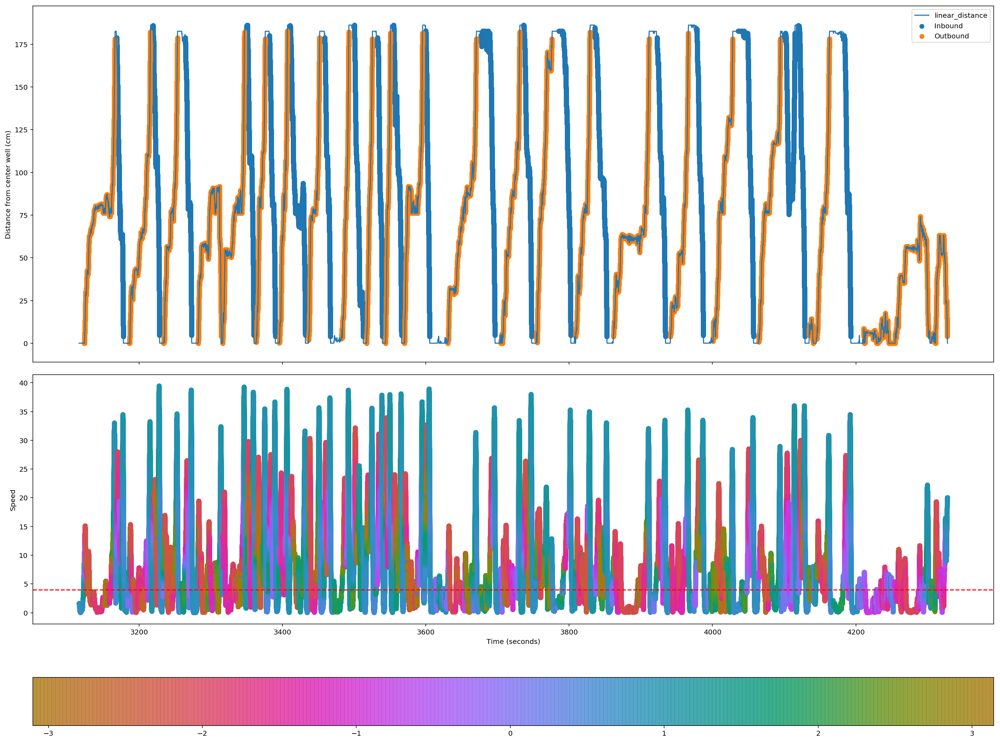

In [10]:
fig, axes = plt.subplots(2, 1, figsize=(20, 15), sharex=True)

axes[0].plot(position_info.index.total_seconds(), position_info.linear_distance)

for label, df in position_info.groupby('task'):
    axes[0].scatter(df.index.total_seconds(), df.linear_distance, label=label)

axes[0].set_ylabel('Distance from center well (cm)')
axes[0].legend();

h = axes[1].scatter(position_info.index.total_seconds(), position_info.speed,
                c=position_info.head_direction, cmap=cmocean.cm.phase, alpha=0.8);
axes[1].set_ylabel('Speed')
axes[1].axhline(4, color='red', linestyle='--')
axes[1].set_xlabel('Time (seconds)');

plt.colorbar(h, orientation='horizontal')

plt.tight_layout()

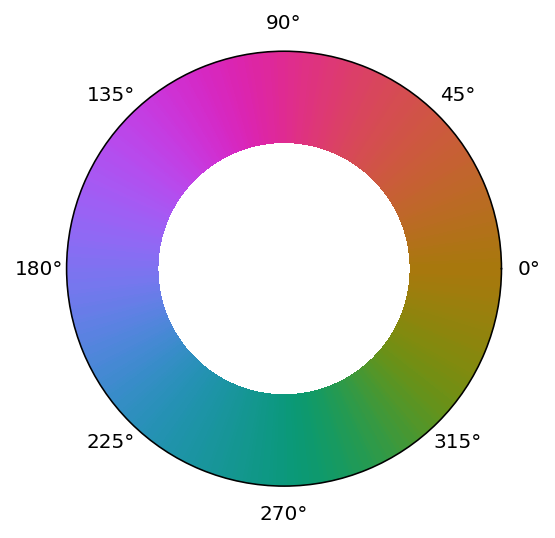

In [12]:
azimuths = np.arange(0, 361, 1)
zeniths = np.arange(40, 70, 1)
values = azimuths * np.ones((30, 361))
fig, ax = plt.subplots(subplot_kw=dict(projection='polar'))
ax.pcolormesh(azimuths*np.pi/180.0, zeniths, values, cmap=cmocean.cm.phase)
ax.set_yticks([]);

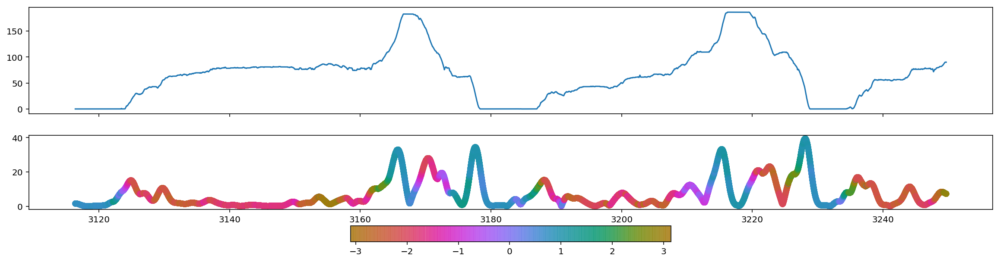

In [14]:
fig, axes = plt.subplots(2, 1, figsize=(20, 5), sharex=True)
ind = slice(0, 200000)

axes[0].plot(position_info.index.total_seconds()[ind], position_info.linear_distance[ind])
h = axes[1].scatter(position_info.index.total_seconds()[ind], position_info.speed[ind],
                c=position_info.head_direction[ind], cmap=cmocean.cm.phase, alpha=0.8);

plt.colorbar(h, orientation='horizontal')

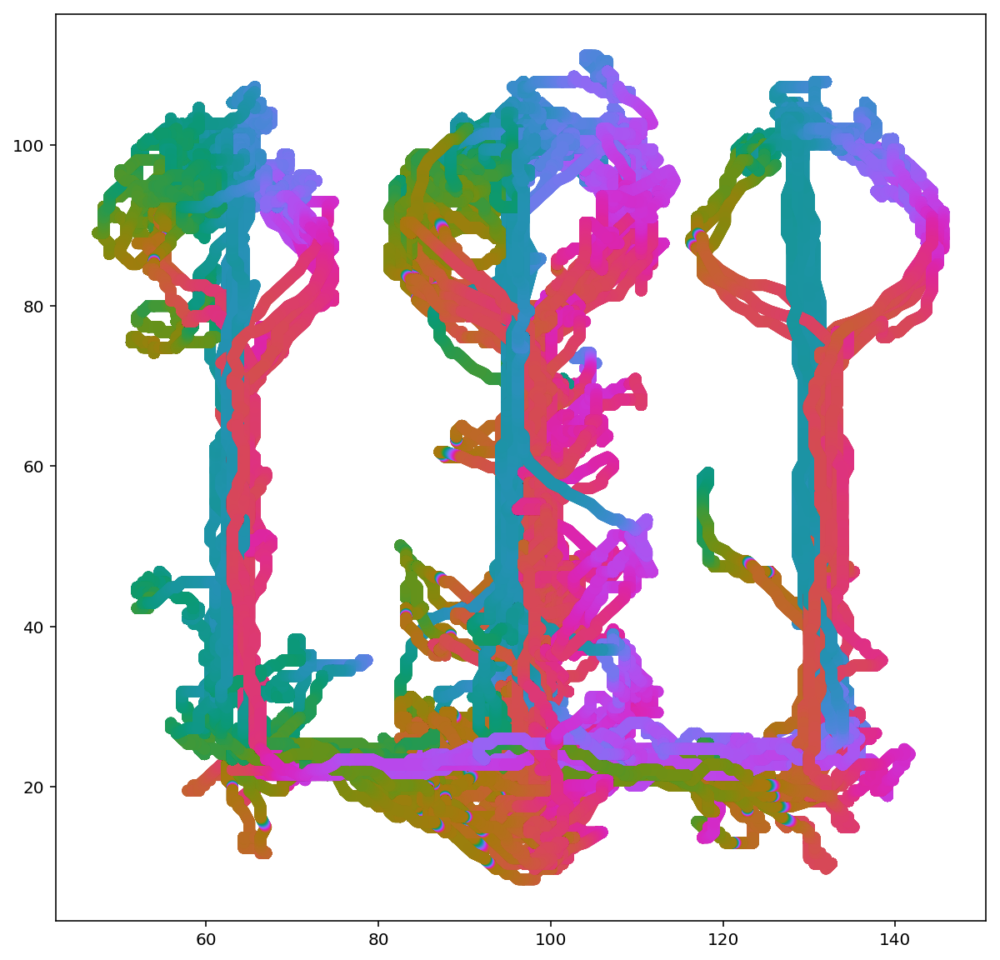

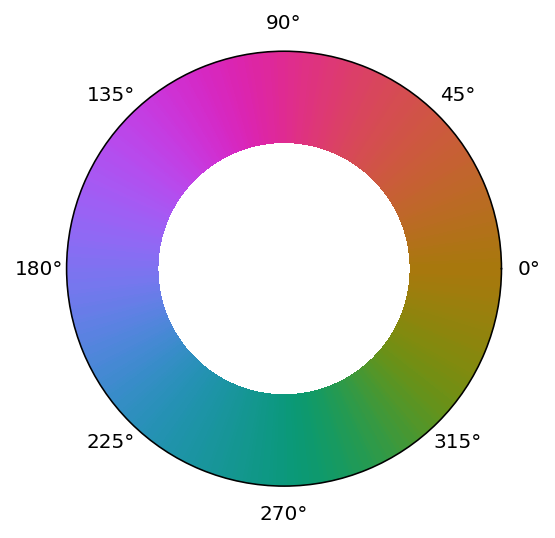

In [16]:
plt.figure(figsize=(10, 10))
plt.scatter(position_info.x_position, position_info.y_position,
            c=position_info.head_direction, cmap=cmocean.cm.phase, alpha=0.8);
azimuths = np.arange(0, 361, 1)
zeniths = np.arange(40, 70, 1)
values = azimuths * np.ones((30, 361))
fig, ax = plt.subplots(subplot_kw=dict(projection='polar'))
ax.pcolormesh(azimuths*np.pi/180.0, zeniths, values, cmap=cmocean.cm.phase)
ax.set_yticks([]);

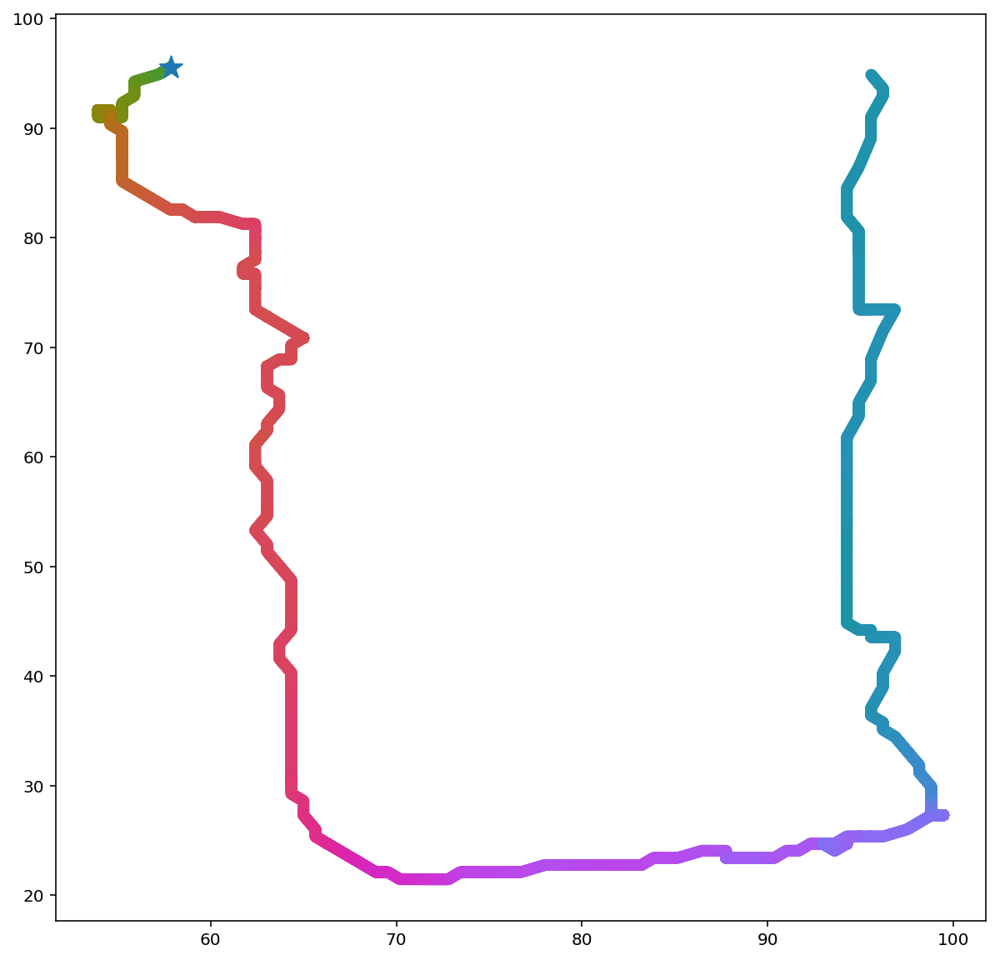

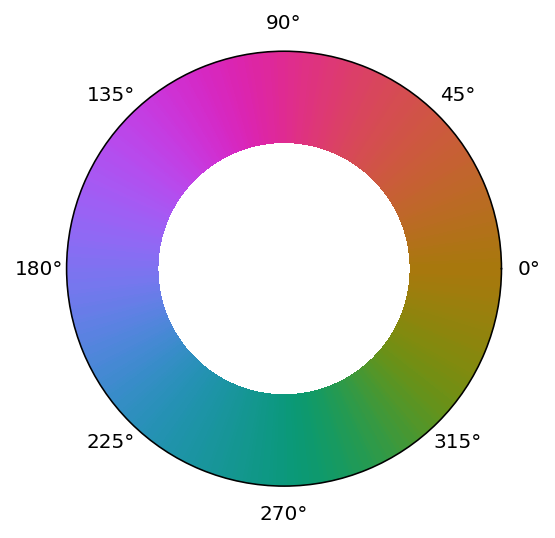

In [39]:
plt.figure(figsize=(10, 10))

segment_ind = 105
plt.scatter(position_info.loc[position_info.labeled_segments == segment_ind].x_position,
            position_info.y_position.loc[position_info.labeled_segments == segment_ind],
            c=position_info.head_direction.loc[position_info.labeled_segments == segment_ind],
            cmap=cmocean.cm.phase, alpha=0.8);
plt.scatter(position_info.loc[position_info.labeled_segments == segment_ind].x_position[0],
            position_info.loc[position_info.labeled_segments == segment_ind].y_position[0],
            marker='*', s=200)
azimuths = np.arange(0, 361, 1)
zeniths = np.arange(40, 70, 1)
values = azimuths * np.ones((30, 361))
fig, ax = plt.subplots(subplot_kw=dict(projection='polar'))
ax.pcolormesh(azimuths*np.pi/180.0, zeniths, values, cmap=cmocean.cm.phase)
ax.set_yticks([]);

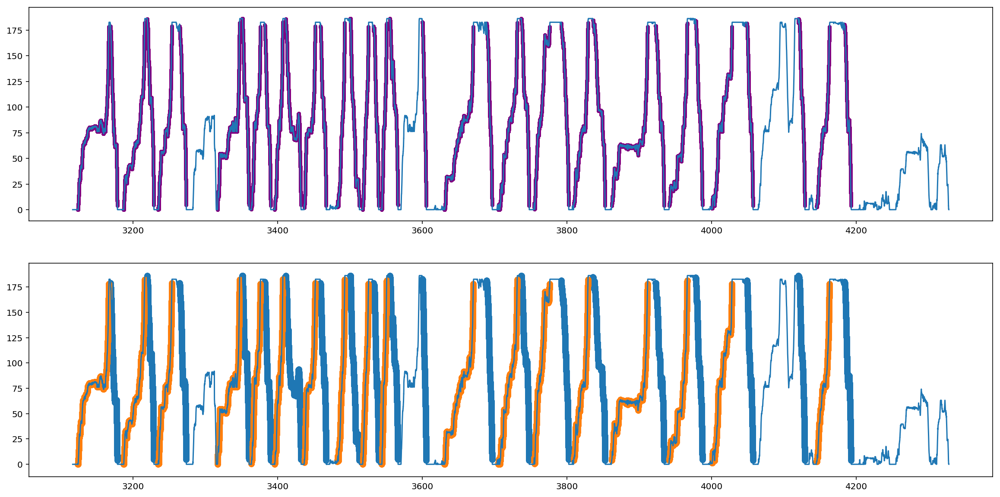

In [10]:
from src.spike_models import DROP_COLUMNS

fig, axes = plt.subplots(2, 1, figsize=(20, 10))
axes[0].plot(position_info.index.total_seconds(), position_info.linear_distance)
data = (position_info
        .loc[~ripple_indicator
             & position_info.is_correct.fillna(True)]
        .drop(DROP_COLUMNS, axis=1).dropna())
axes[0].scatter(data.index.total_seconds(), data.linear_distance, color='purple', s=10);

axes[1].plot(position_info.index.total_seconds(), position_info.linear_distance)

for label, df in data.groupby('task'):
    axes[1].scatter(df.index.total_seconds(), df.linear_distance, label=label)


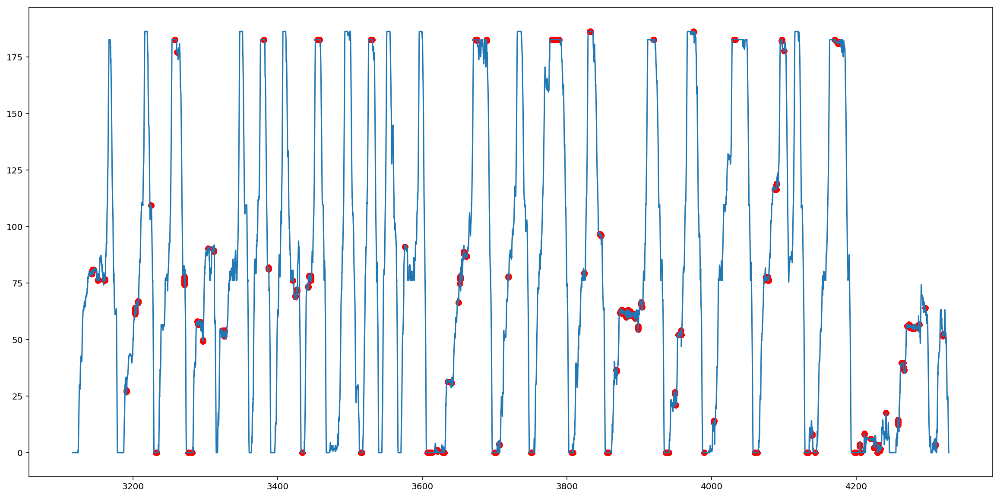

In [329]:
from src.spike_models import DROP_COLUMNS

plt.figure(figsize=(20, 10))
plt.plot(position_info.index.total_seconds(), position_info.linear_distance)
data = (position_info.loc[ripple_indicator])
plt.scatter(data.index.total_seconds(), data.linear_distance, color='red');

In [146]:

from src.spike_models import (fit_task, fit_1D_position_by_task, fit_1D_position_by_speed,
                              fit_1D_position, fit_position_constant,
                              fit_1D_position_by_speed_by_task)

constant_model = []
task_model = []
position_model = []
position_by_task_model = []
position_by_speed_model = []
position_by_speed_by_task_model = []

for neuron_key in neuron_info.index:
    print(neuron_key)
    spikes = get_spike_indicator_dataframe(
        neuron_key, ANIMALS).rename('is_spike')
    non_ripple_data = (position_info.join(spikes)
            .loc[~ripple_indicator & position_info.is_correct.fillna(True)]
            .drop(DROP_COLUMNS, axis=1)
            .dropna())
    
    constant_model.append(fit_position_constant(non_ripple_data, SAMPLING_FREQUENCY))
    task_model.append(fit_task(non_ripple_data, SAMPLING_FREQUENCY))
    position_model.append(fit_1D_position(non_ripple_data, SAMPLING_FREQUENCY))
    position_by_task_model.append(fit_1D_position_by_task(non_ripple_data, SAMPLING_FREQUENCY))
    position_by_speed_model.append(fit_1D_position_by_speed(non_ripple_data, SAMPLING_FREQUENCY))
    position_by_speed_by_task_model.append(fit_1D_position_by_speed_by_task(non_ripple_data, SAMPLING_FREQUENCY))

('HPa', 5, 2, 1, 1)
('HPa', 5, 2, 1, 2)
('HPa', 5, 2, 1, 3)
('HPa', 5, 2, 1, 4)
('HPa', 5, 2, 1, 5)
('HPa', 5, 2, 1, 6)
('HPa', 5, 2, 1, 7)
('HPa', 5, 2, 1, 8)
('HPa', 5, 2, 4, 1)
('HPa', 5, 2, 4, 2)
('HPa', 5, 2, 4, 3)
('HPa', 5, 2, 4, 4)
('HPa', 5, 2, 4, 5)
('HPa', 5, 2, 4, 6)
('HPa', 5, 2, 4, 7)
('HPa', 5, 2, 4, 8)
('HPa', 5, 2, 4, 9)
('HPa', 5, 2, 5, 1)
('HPa', 5, 2, 5, 2)
('HPa', 5, 2, 8, 1)
('HPa', 5, 2, 9, 1)
('HPa', 5, 2, 11, 1)
('HPa', 5, 2, 12, 1)
('HPa', 5, 2, 12, 2)
('HPa', 5, 2, 12, 3)
('HPa', 5, 2, 14, 1)
('HPa', 5, 2, 17, 1)
('HPa', 5, 2, 17, 2)
('HPa', 5, 2, 18, 1)
('HPa', 5, 2, 18, 2)


In [298]:
results = {}

results['constant_model'] = xr.concat(constant_model, dim=neuron_info.neuron_id)
results['task_model'] = xr.concat(task_model, dim=neuron_info.neuron_id)
results['position_model'] = xr.concat(position_model, dim=neuron_info.neuron_id)
results['position_by_task_model'] = xr.concat(position_by_task_model, dim=neuron_info.neuron_id)
results['position_by_speed_model'] = xr.concat(position_by_speed_model, dim=neuron_info.neuron_id)
results['position_by_speed_by_task_model'] = xr.concat(position_by_speed_by_task_model, dim=neuron_info.neuron_id)

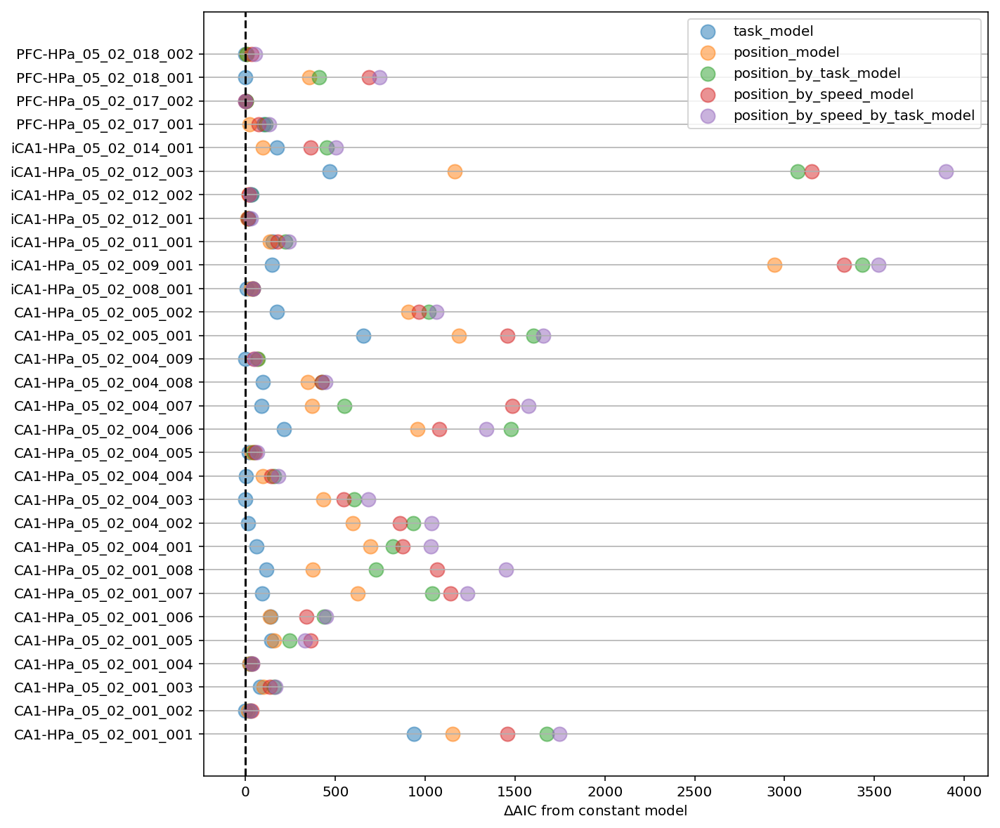

In [299]:
n_neurons = len(neuron_info)
neuron_ind = np.arange(n_neurons)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

for model in results:
    if model != 'constant_model':
        AIC_diff = results['constant_model'].AIC - results[model].AIC
        ax.scatter(AIC_diff, neuron_ind, label=model, s=100, alpha=0.5)

ax.set_yticks(neuron_ind)
ax.set_yticklabels(neuron_info.area + '-' + neuron_info.neuron_id)
ax.axvline(0, color='black', linestyle='--')
ax.set_xlabel(r'$\Delta$AIC from constant model')
ax.grid(axis='y')
ax.legend();

In [300]:
AIC = pd.concat([results[model].AIC.to_dataframe().rename(columns={'AIC': model})
                 for model in results], axis=1)

best_model = AIC.columns[np.argmin(AIC.values, axis=1)]

best_model

Index(['position_by_speed_by_task_model', 'position_by_speed_model',
       'position_by_speed_by_task_model', 'position_by_speed_model',
       'position_by_speed_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'position_by_task_model',
       'position_by_speed_by_task_model', 'position_by_speed_by_task_model',
       'position_by_task_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'task_model',
       'position_by_speed_by_task_model', 'position_by_speed_by_task_model',
       'position_by_speed_by_task_model', 'position_by_task_mo

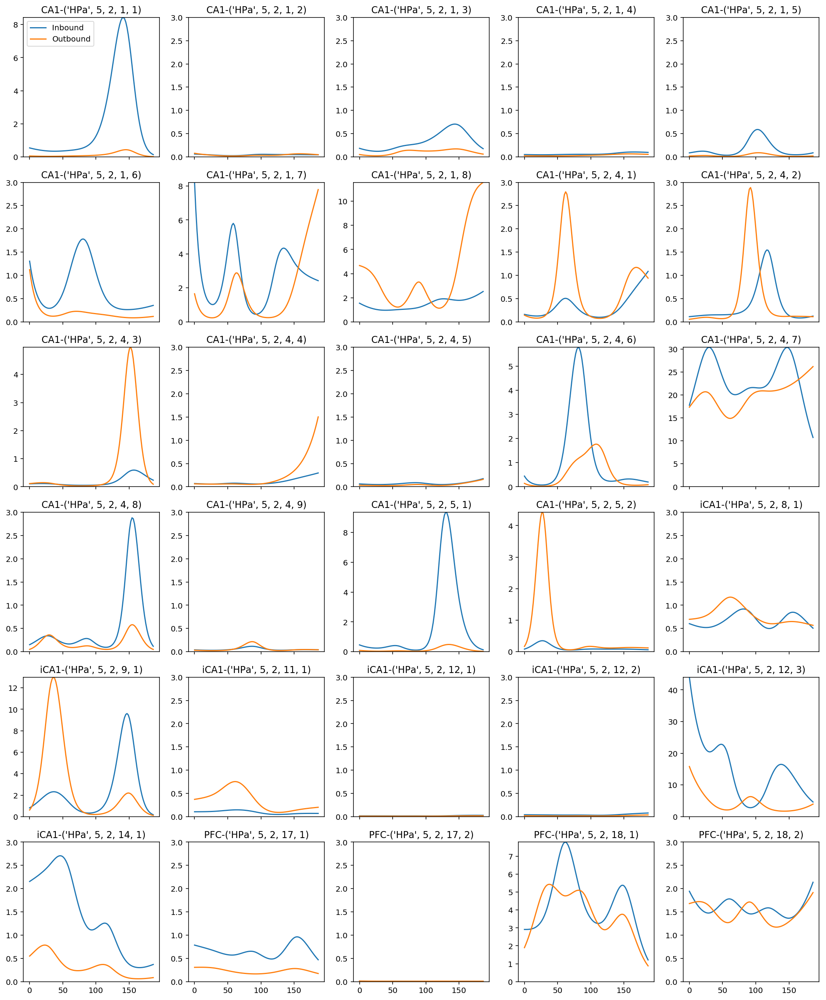

In [247]:
col_wrap = 5
n_rows = np.ceil(n_neurons / col_wrap).astype(int)

position = results['position_by_task_model'].position

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True)
for ax, neuron_key in zip(axes.ravel(), neuron_info.index):
    n = neuron_info.loc[neuron_key]
    inbound_rate = results['position_by_task_model'].sel(neuron_id=n.neuron_id, task='Inbound').firing_rate
    outbound_rate = results['position_by_task_model'].sel(neuron_id=n.neuron_id, task='Outbound').firing_rate
    ax.plot(position, inbound_rate, label='Inbound')
    ax.plot(position, outbound_rate, label='Outbound')
    ax.set_ylim((0, np.max([inbound_rate.max(), outbound_rate.max(), 3])))
    ax.set_title(n.area + '-' + str(neuron_key))
    
axes[0, 0].legend();
plt.tight_layout()

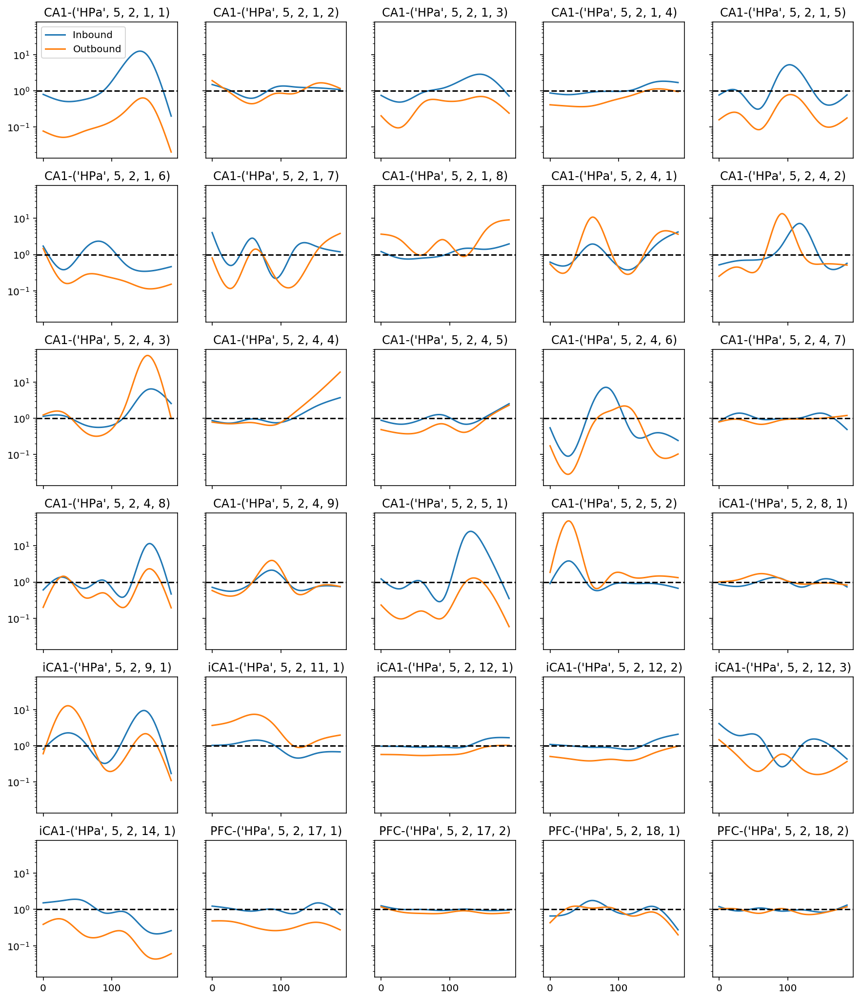

In [248]:
col_wrap = 5
n_rows = np.ceil(n_neurons / col_wrap).astype(int)

position = results['position_by_task_model'].position

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True, sharey=True)
for ax, neuron_key in zip(axes.ravel(), neuron_info.index):
    n = neuron_info.loc[neuron_key]
    inbound_rate = results['position_by_task_model'].sel(neuron_id=n.neuron_id, task='Inbound').multiplicative_gain
    outbound_rate = results['position_by_task_model'].sel(neuron_id=n.neuron_id, task='Outbound').multiplicative_gain
    ax.semilogy(position, inbound_rate, label='Inbound')
    ax.semilogy(position, outbound_rate, label='Outbound')
    ax.axhline(1, color='black', linestyle='--')
    ax.set_title(n.area + '-' + str(neuron_key))
    
axes[0, 0].legend();

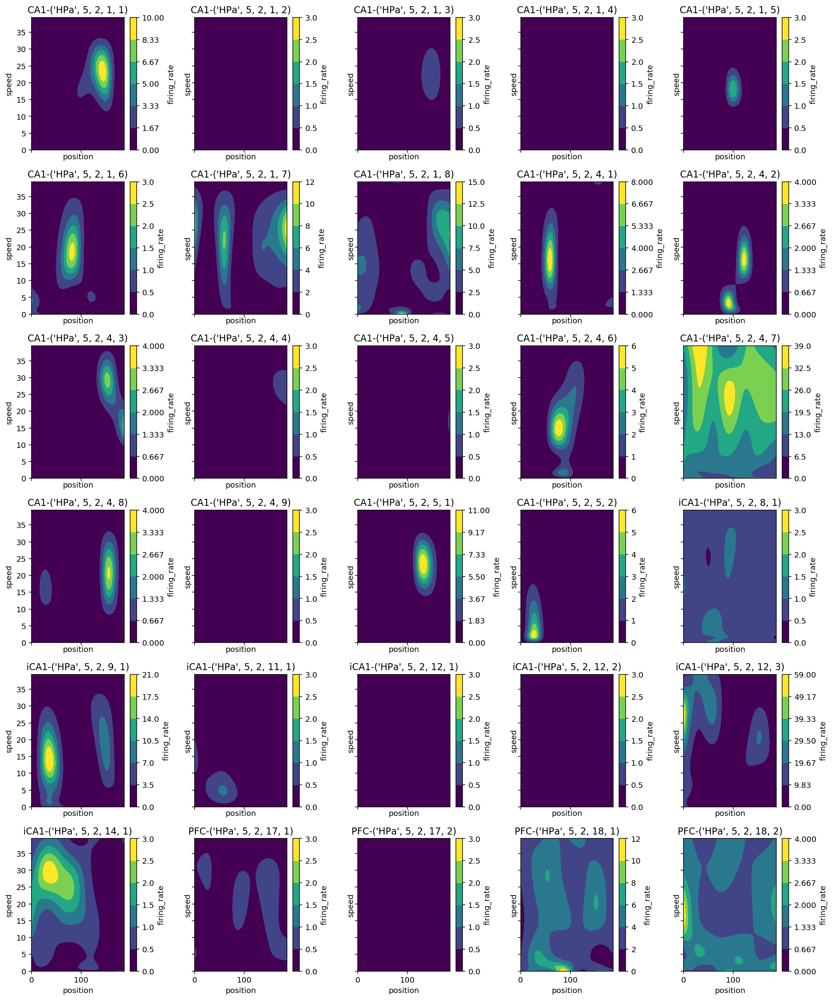

In [249]:
col_wrap = 5
n_rows = np.ceil(n_neurons / col_wrap).astype(int)

position = results['position_by_task_model'].position

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True, sharey=True)
for ax, neuron_key in zip(axes.ravel(), neuron_info.index):
    n = neuron_info.loc[neuron_key]
    rate = results['position_by_speed_model'].sel(neuron_id=n.neuron_id).firing_rate
    max_rate = np.ceil(np.max([rate.max().values, 3]))
    rate.plot.contourf(x='position', y='speed', ax=ax, vmin=0, vmax=max_rate)
    ax.set_title(n.area + '-' + str(neuron_key))
    
plt.tight_layout()

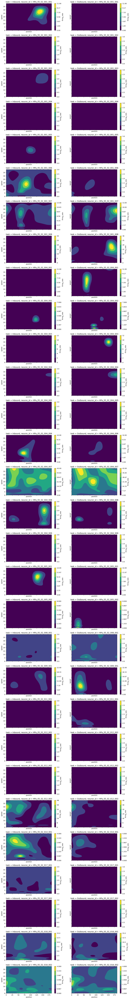

In [315]:
fig, axes = plt.subplots(n_neurons, 2, figsize=(2 * 6, n_neurons * 3), sharex=True, sharey=True)

for ax, neuron_key in zip(axes, neuron_info.index):
    n = neuron_info.loc[neuron_key]
    rate = results['position_by_speed_by_task_model'].sel(neuron_id=n.neuron_id).firing_rate
    max_rate = np.ceil(np.max([rate.max().values, 3]))
    rate.sel(task='Inbound').plot.contourf(x='position', y='speed',
                                           ax=ax[0], vmin=0, vmax=max_rate)
    rate.sel(task='Outbound').plot.contourf(x='position', y='speed',
                                           ax=ax[1],vmin=0, vmax=max_rate)
    
plt.tight_layout()

## Spike-Field Coherence

In [92]:
from src.analysis import get_hippocampal_theta

theta = get_hippocampal_theta(epoch_key, ANIMALS, SAMPLING_FREQUENCY)

In [121]:
from regularized_glm import penalized_IRLS
from statsmodels.api import families

spike_field_coherence = []

for neuron_key in neuron_info.index:
    print(neuron_key)
    spikes = get_spike_indicator_dataframe(
        neuron_key, ANIMALS).rename('is_spike')
    data = theta.join(spikes).join(position_info).loc[position_info.speed >= 4].dropna()
    formula = 'is_spike ~ 1 + np.cos(instantaneous_phase) + np.sin(instantaneous_phase)'
    response, design_matrix = dmatrices(formula, data)
    penalty = np.ones((design_matrix.shape[1], )) * 1E1
    penalty[0] = 0
    fit = penalized_IRLS(design_matrix, response, family=families.Poisson(), penalty=penalty)
    spike_field_coherence.append(fit.coefficients[1] + 1j * fit.coefficients[2])

('HPa', 5, 2, 1, 1)
('HPa', 5, 2, 1, 2)
('HPa', 5, 2, 1, 3)
('HPa', 5, 2, 1, 4)
('HPa', 5, 2, 1, 5)
('HPa', 5, 2, 1, 6)
('HPa', 5, 2, 1, 7)
('HPa', 5, 2, 1, 8)
('HPa', 5, 2, 4, 1)
('HPa', 5, 2, 4, 2)
('HPa', 5, 2, 4, 3)
('HPa', 5, 2, 4, 4)
('HPa', 5, 2, 4, 5)
('HPa', 5, 2, 4, 6)
('HPa', 5, 2, 4, 7)
('HPa', 5, 2, 4, 8)
('HPa', 5, 2, 4, 9)
('HPa', 5, 2, 5, 1)
('HPa', 5, 2, 5, 2)
('HPa', 5, 2, 8, 1)
('HPa', 5, 2, 9, 1)
('HPa', 5, 2, 11, 1)
('HPa', 5, 2, 12, 1)
('HPa', 5, 2, 12, 2)
('HPa', 5, 2, 12, 3)
('HPa', 5, 2, 14, 1)
('HPa', 5, 2, 17, 1)
('HPa', 5, 2, 17, 2)
('HPa', 5, 2, 18, 1)
('HPa', 5, 2, 18, 2)


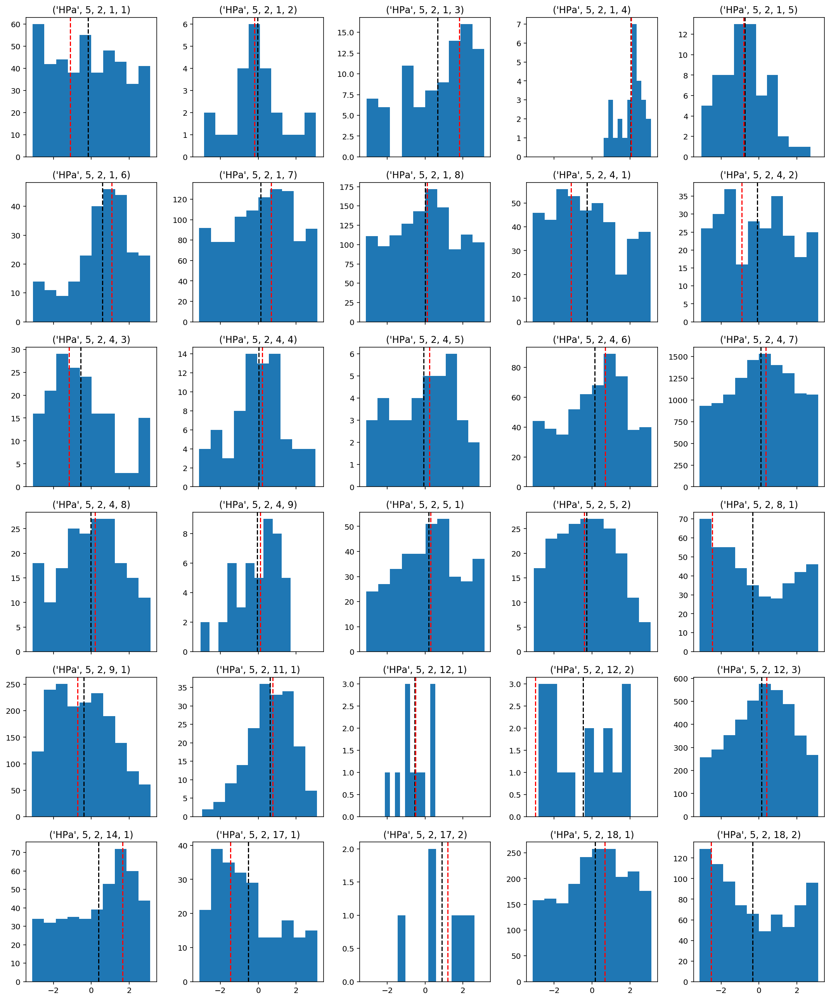

In [131]:
col_wrap = 5
n_neurons = len(neuron_info)
n_rows = np.ceil(n_neurons / col_wrap).astype(int)

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True)

for neuron_ind, (ax, neuron_key) in enumerate(zip(axes.flat, neuron_info.index)):
    spikes = get_spike_indicator_dataframe(
        neuron_key, ANIMALS).rename('is_spike')
    data = theta.join(spikes).join(position_info).loc[position_info.speed >= 4].dropna()
    ax.hist(data.loc[data.is_spike == 1].instantaneous_phase)
    ax.axvline(data.loc[data.is_spike == 1].instantaneous_phase.mean(),
               color='black', linestyle='--')
    ax.axvline(np.angle(spike_field_coherence[neuron_ind]),
           color='red', linestyle='--')
    ax.set_title(neuron_key)

plt.tight_layout()

## LFP-LFP Coherence

In [10]:
from loren_frank_data_processing import get_LFPs, make_tetrode_dataframe
from src.parameters import ANIMALS, SAMPLING_FREQUENCY

tetrode_info = make_tetrode_dataframe(ANIMALS).xs(epoch_key, drop_level=False)
tetrode_keys = tetrode_info.loc[(tetrode_info.descrip != 'CA1Ref')
                                & tetrode_info.area.isin(['CA1', 'PFC'])].index
lfps = get_LFPs(tetrode_keys, ANIMALS)

In [73]:
from spectral_connectivity import Multitaper, Connectivity
from itertools import combinations


m = Multitaper(
    lfps.values, SAMPLING_FREQUENCY, time_window_duration=3.000,
    time_halfbandwidth_product=3, start_time=lfps.index.total_seconds()[0])
c = Connectivity.from_multitaper(m)
theta_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + np.diff(c.time)[0] / 2, frequency=c.frequencies, signals=tetrode_keys), name='power')
m.frequency_resolution

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=3,
           time_window_duration=3.0, time_window_step=3.0,
           detrend_type='constant', start_time=3116.3446000000004, n_tapers=5)


1.0

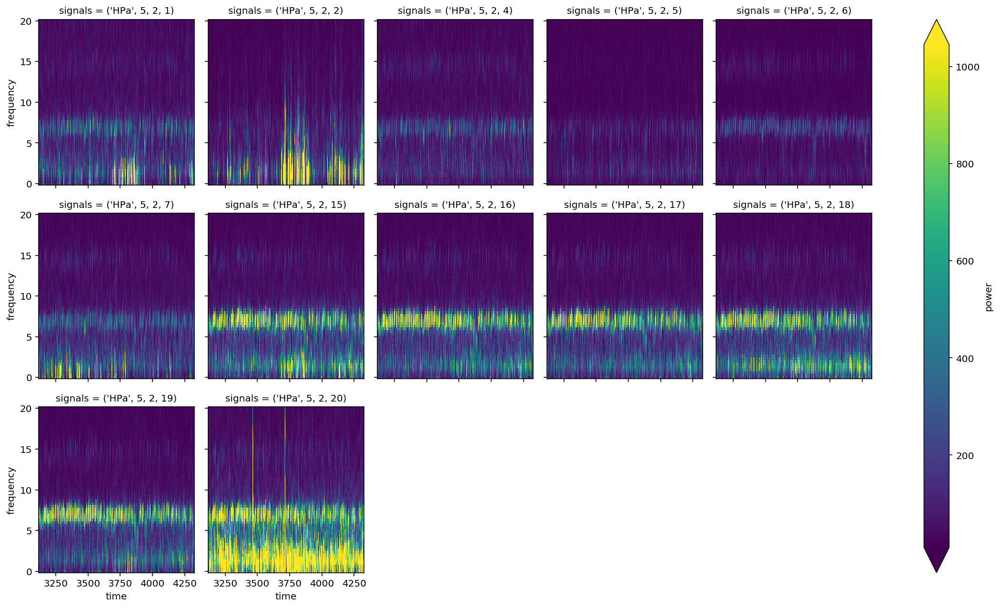

In [74]:
theta_power.sel(frequency=slice(0, 20)).plot(x='time', y='frequency', col='signals', col_wrap=5, robust=True);

In [116]:
fourier_coefficients = m.fft().squeeze()
frequencies = m.frequencies
freq_ind = (frequencies > 0) & (frequencies < 20)

frequencies = frequencies[freq_ind]
fourier_coefficients = fourier_coefficients[..., freq_ind, :]

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=3,
           time_window_duration=3.0, time_window_step=3.0,
           detrend_type='constant', start_time=3116.3446000000004, n_tapers=5)


In [117]:
power = np.mean(
            fourier_coefficients *
            fourier_coefficients.conjugate(), axis=1).real

In [119]:
norm = np.sqrt(power[..., :, np.newaxis] *
               power[..., np.newaxis, :])

cross_spectral_matrix = fourier_coefficients[..., :, np.newaxis] @ fourier_coefficients[..., np.newaxis, :].conjugate()

In [120]:
complex_coherencey = (
            np.mean(cross_spectral_matrix, axis=1) / norm)

In [124]:
complex_coherencey.shape

(403, 59, 12, 12)

In [135]:
tetrode_names = tetrode_info.loc[(tetrode_info.descrip != 'CA1Ref')
                                & tetrode_info.area.isin(['CA1', 'PFC'])].tetrode_id.values
dimension_names = ['time', 'frequency', 'tetrode1', 'tetrode2']
data_vars = {
    'coherence_magnitude': (dimension_names, np.abs(complex_coherencey) ** 2)}
coordinates = {
    'time': m.time + np.diff(m.time)[0] / 2,
    'frequency': frequencies,
    'tetrode1': tetrode_names,
    'tetrode2': tetrode_names,
}

coherence_magnitude = xr.Dataset(data_vars, coords=coordinates)
coherence_magnitude

<xarray.Dataset>
Dimensions:              (frequency: 59, tetrode1: 12, tetrode2: 12, time: 403)
Coordinates:
  * time                 (time) float64 3.118e+03 3.121e+03 3.124e+03 ...
  * frequency            (frequency) float64 0.3333 0.6667 1.0 1.333 1.667 ...
  * tetrode1             (tetrode1) object 'HPa_05_02_001' 'HPa_05_02_002' ...
  * tetrode2             (tetrode2) object 'HPa_05_02_001' 'HPa_05_02_002' ...
Data variables:
    coherence_magnitude  (time, frequency, tetrode1, tetrode2) float64 1.0 ...

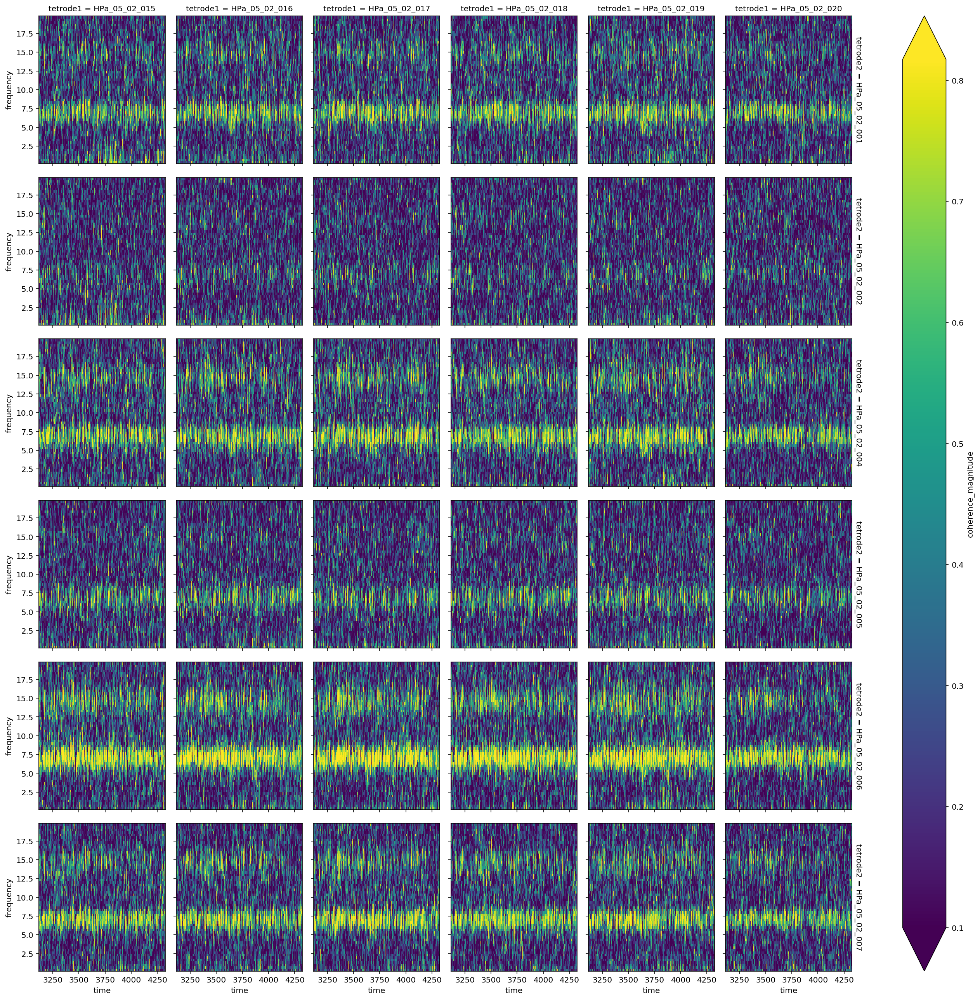

In [139]:
coherence_magnitude.coherence_magnitude.sel(
    tetrode1=tetrode_info.loc[tetrode_info.area == 'PFC'].tetrode_id.values,
    tetrode2=tetrode_info.loc[(tetrode_info.area == 'CA1') & (tetrode_info.descrip != 'CA1Ref')].tetrode_id.values
).plot(x='time', y='frequency', col='tetrode1', row='tetrode2', robust=True, vmin=0.1)

## Spike-Spike